In [1]:
import pickle
import pumpp
import numpy as np
import librosa
import os
from glob import glob

import tensorflow as tf
import keras as K
import pescador
import pandas as pd

from sklearn.cross_validation import LabelShuffleSplit

Using TensorFlow backend.


In [2]:
SEED = 20170319

In [3]:
DATA_DIR = '/home/bmcfee/working/chords/pump'

In [4]:
# Reload the pump
with open('/home/bmcfee/working/chords/pump.pkl', 'rb') as fd:
    pump = pickle.load(fd)

In [5]:
# Calculate the number of frames

MAX_SAMPLES = 128

duration = 4.0

pump.ops[0].sr

n_frames = librosa.time_to_frames(duration,
                                  sr=pump.ops[0].sr,
                                  hop_length=pump.ops[0].hop_length)[0]

sampler = pump.sampler(MAX_SAMPLES, n_frames)

In [6]:
n_frames

43

In [7]:
def data_sampler(fname, sampler):

    data = np.load(fname)
    yield from sampler(data)
    data.close()
    

In [8]:
def data_sampler(fname, sampler):

    data = np.load(fname)
    d2 = dict(data)
    data.close
    data = d2
    yield from sampler(data)

In [9]:
def data_generator(tracks, sampler, k, batch_size=16, **kwargs):
    
    seeds = []
    for track in tracks:
        fname = os.path.join(DATA_DIR, os.path.extsep.join([track, 'npz']))
        
        seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
    # Send it all to a mux
    mux = pescador.Mux(seeds, k, **kwargs)
    
    if batch_size == 1:
        return mux
    else:
        return pescador.BufferedStreamer(mux, batch_size)

In [10]:
def data_generator(tracks, sampler, k, batch_size=16, augmentation=False, **kwargs):
    
    seeds = []
    for track in tracks:
        
        fname = os.path.join(DATA_DIR, os.path.extsep.join([track, 'npz']))
        seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
        if augmentation:
            for fname in sorted(glob(os.path.join(DATA_DIR, '{}.*.npz'.format(track)))):
                seeds.append(pescador.Streamer(data_sampler, fname, sampler))
        
    # Send it all to a mux
    mux = pescador.Mux(seeds, k, **kwargs)
    
    if batch_size == 1:
        return mux
    else:
        return pescador.BufferedStreamer(mux, batch_size)

In [11]:
def wrap(gen):
    
    for batch in gen:
        yield batch[0], list(batch[1:])

# Construct the model

In [12]:
pump.fields

{'chord_struct/bass': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_struct/pitch': Tensor(shape=(None, 12), dtype=<class 'bool'>),
 'chord_struct/root': Tensor(shape=(None, 13), dtype=<class 'bool'>),
 'chord_tag/chord': Tensor(shape=(None, 170), dtype=<class 'bool'>),
 'cqt/mag': Tensor(shape=(None, 288, 1), dtype=<class 'numpy.float32'>)}

In [13]:
len(pump['chord_tag'].vocabulary())

170

In [15]:
x = pump.layers()['cqt/mag']

b = K.layers.BatchNormalization()(x)

c0 = K.layers.Convolution2D(1, (5, 5), padding='same', activation='relu',
                            data_format='channels_last')(b)

c1 = K.layers.Convolution2D(48, (1, int(c0.shape[2])), padding='valid', activation='relu',
                            data_format='channels_last')(c0)

r1 = K.layers.Lambda(lambda x: K.backend.squeeze(x, axis=2))(c1)

rs = K.layers.Bidirectional(K.layers.GRU(128,
                                         return_sequences=True))(r1)

# 1: pitch class predictor
pc_p = K.layers.TimeDistributed(K.layers.Dense(pump.fields['chord_struct/pitch'].shape[1], activation='sigmoid'),
                       name='chord_pitch')(rs)

# 2: root predictor
root_p = K.layers.TimeDistributed(K.layers.Dense(pump.fields['chord_struct/root'].shape[1], activation='softmax'),
                         name='chord_root')(rs)

# Quality encoder

pc_pack = K.layers.Lambda(lambda x: K.backend.expand_dims(x, axis=-1))(pc_p)


quality_c = K.layers.Convolution2D(32, (1, int(pc_pack.shape[2])*2+1), padding='same',
                                   activation='relu', data_format='channels_last')(pc_pack)

quality_p = K.layers.MaxPooling2D((1, int(quality_c.shape[2])))(quality_c)

quality = K.layers.Lambda(lambda x: K.backend.squeeze(x, axis=2))(quality_p)


codec = K.layers.concatenate([root_p, quality])

tag = K.layers.TimeDistributed(K.layers.Dense(pump.fields['chord_tag/chord'].shape[1], activation='softmax'),
                      name='chord_tag')(codec)

model = K.models.Model(x, [tag, pc_p, root_p])

# Run a train-test split

In [88]:
index = pd.read_json('/home/bmcfee/working/chords/artist_index.json', typ='series')

for train_, test in LabelShuffleSplit(list(index), n_iter=1, random_state=SEED):
    idx_train_ = index.iloc[train_]
    idx_test = index.iloc[test]
    for train, val in LabelShuffleSplit(list(idx_train_), n_iter=1, test_size=0.25, random_state=SEED):
        idx_train = idx_train_.iloc[train]
        idx_val = idx_train_.iloc[val]
    
        gen_train = data_generator(idx_train.index, sampler, 512, augmentation=True,
                                   lam=32, batch_size=32, revive=True, random_state=SEED)
        
        gen_val = data_generator(idx_val.index, sampler, len(idx_val),
                                 batch_size=32, revive=True, random_state=SEED)
        

        model.compile(K.optimizers.Adam(),
                      loss={'chord_tag': 'categorical_crossentropy',
                            'chord_pitch': 'binary_crossentropy',
                            'chord_root': 'categorical_crossentropy'},
                      metrics={'chord_tag': 'categorical_accuracy'})

        model.fit_generator(wrap(gen_train.tuples('cqt/mag', 
                                              'chord_tag/chord',
                                              'chord_struct/pitch',
                                              'chord_struct/root')), 512, 100,
                            
                            validation_data=wrap(gen_val.tuples('cqt/mag',
                                                            'chord_tag/chord',
                                                            'chord_struct/pitch',
                                                            'chord_struct/root')),
                            validation_steps=512,
                            callbacks=[K.callbacks.ModelCheckpoint('/home/bmcfee/working/chords/model_sconv_ckpt.pkl',
                                                                   save_best_only=True,
                                                                   verbose=1,
                                                                   monitor='val_chord_tag_loss'),
                                       K.callbacks.EarlyStopping(monitor='val_chord_tag_loss', patience=20, verbose=1)])

Epoch 1/100
512/512 [==============================] - 98s - loss: 2.8710 - chord_tag_loss: 1.7766 - chord_pitch_loss: 0.3175 - chord_root_loss: 0.7769 - chord_tag_categorical_accuracy: 0.5411 - val_loss: 2.6077 - val_chord_tag_loss: 1.6888 - val_chord_pitch_loss: 0.2582 - val_chord_root_loss: 0.6607 - val_chord_tag_categorical_accuracy: 0.5479
Epoch 2/100
512/512 [==============================] - 91s - loss: 2.7498 - chord_tag_loss: 1.7174 - chord_pitch_loss: 0.3081 - chord_root_loss: 0.7244 - chord_tag_categorical_accuracy: 0.5493 - val_loss: 2.5919 - val_chord_tag_loss: 1.6620 - val_chord_pitch_loss: 0.2581 - val_chord_root_loss: 0.6719 - val_chord_tag_categorical_accuracy: 0.5705
Epoch 3/100
512/512 [==============================] - 93s - loss: 2.6901 - chord_tag_loss: 1.6793 - chord_pitch_loss: 0.3009 - chord_root_loss: 0.7098 - chord_tag_categorical_accuracy: 0.5602 - val_loss: 2.5421 - val_chord_tag_loss: 1.6300 - val_chord_pitch_loss: 0.2516 - val_chord_root_loss: 0.6605 - va

In [89]:
model.load_weights('/home/bmcfee/working/chords/model_sconv_ckpt.pkl')

# Diagnostics

In [90]:
import jams.display
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib nbagg
import librosa.display

<IPython.core.display.Javascript object>


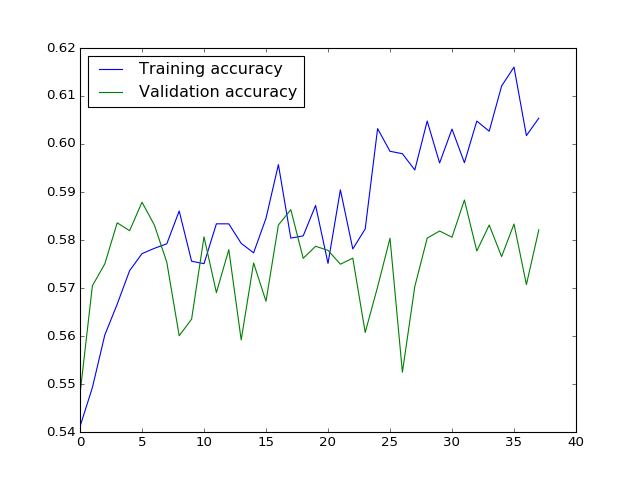

In [91]:
history = pd.DataFrame.from_dict(model.history.history)
plt.figure()

plt.plot(history['chord_tag_categorical_accuracy'], label='Training accuracy')
plt.plot(history['val_chord_tag_categorical_accuracy'], label='Validation accuracy')
plt.legend(loc='best')

In [92]:
l1 = model.get_weights()[4].squeeze()

<IPython.core.display.Javascript object>


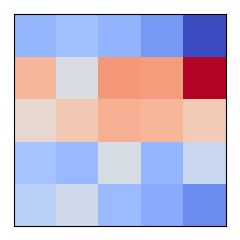

In [93]:
plt.figure(figsize=(3,3))

librosa.display.specshow(l1.T, vmin=l1.min(), vmax=l1.max())
    
plt.tight_layout()

In [94]:
l2 = model.get_weights()[6].squeeze()
l2 = librosa.util.axis_sort(l2)

In [95]:
weights = model.get_weights()

In [96]:
weights[16].shape

(1, 25, 1, 32)

<IPython.core.display.Javascript object>


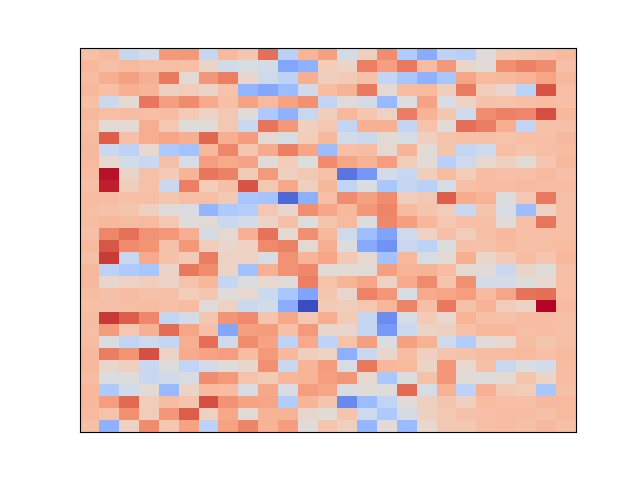

In [97]:
plt.figure()
librosa.display.specshow(weights[16].squeeze().T)

In [98]:
model.get_weights()[-2].shape

(45, 170)

<IPython.core.display.Javascript object>


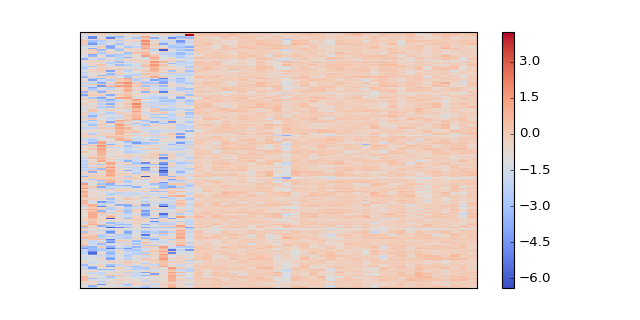

In [114]:
plt.figure(figsize=(8, 4))
librosa.display.specshow(model.get_weights()[-2].T)
plt.colorbar()

<IPython.core.display.Javascript object>


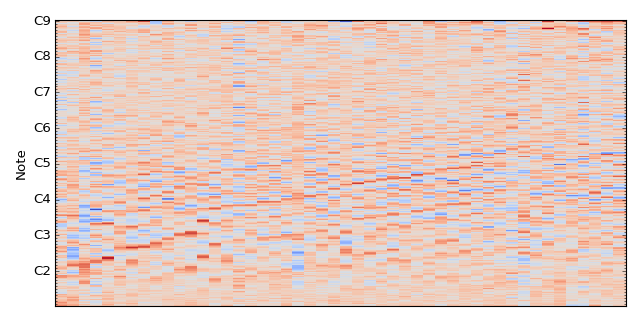

In [100]:
plt.figure(figsize=(8,4))
librosa.display.specshow(l2, y_axis='cqt_note', sr=pump.ops[0].sr, bins_per_octave=36)
plt.tight_layout()

---
# Validation viz

In [110]:
import pandas as pd
import jams

from tqdm import tqdm_notebook as tqdm

In [111]:
def score_model(pump, model, idx,
                features='/home/bmcfee/working/chords/pump',
                refs='/home/bmcfee/data/eric_chords/references_v2/'):
    
    results = {}
    for item in tqdm(idx.index):
        jam = jams.load('{}/{}.jams'.format(refs, item), validate=False)
        datum = np.load('{}/{}.npz'.format(features, item))['cqt/mag']
        
        ann = pump.ops[1].inverse(model.predict(datum)[0][0])
        results[item] = jams.eval.chord(jam.annotations['chord', 0], ann)
        
    return pd.DataFrame.from_dict(results, orient='index')

In [112]:
df = score_model(pump, model, idx_test)

In [113]:
df.describe().loc['mean']

thirds          0.724604
thirds_inv      0.687016
triads          0.680627
triads_inv      0.648364
tetrads         0.541171
tetrads_inv     0.515574
root            0.781059
mirex           0.757597
majmin          0.745070
majmin_inv      0.707869
sevenths        0.604492
sevenths_inv    0.573872
Name: mean, dtype: float64

In [103]:
F = idx_val.index[10]

In [104]:
datum = np.load('/home/bmcfee/working/chords/pump/{}.npz'.format(F))

In [105]:
J = jams.load('/home/bmcfee/data/eric_chords/references_v2/{}.jams'.format(F))

In [106]:
ann_true = pump['chord_tag'].inverse(datum['chord_tag/chord'][0])

In [107]:
ann = pump['chord_tag'].inverse(model.predict(datum['cqt/mag'])[0][0])

In [108]:
pd.DataFrame.from_records([jams.eval.chord(J.annotations['chord', 0], ann)]).loc[0]

majmin          0.665957
majmin_inv      0.612542
mirex           0.677898
root            0.651471
sevenths        0.470831
sevenths_inv    0.431320
tetrads         0.432470
tetrads_inv     0.396178
thirds          0.618825
thirds_inv      0.565354
triads          0.611698
triads_inv      0.562636
Name: 0, dtype: float64

<IPython.core.display.Javascript object>


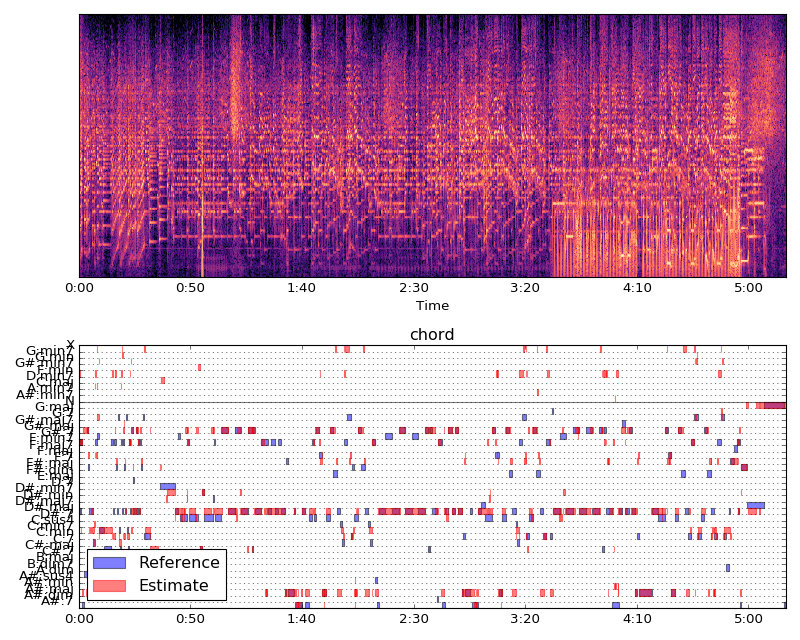

In [109]:
plt.figure(figsize=(10, 8))

ax = plt.subplot(2,1,1)
librosa.display.specshow(datum['cqt/mag'][0, :, :, 0].T,
                         sr=pump.ops[0].sr,
                         hop_length=pump.ops[0].hop_length,
                         x_axis='time')

plt.subplot(2,1,2, sharex=ax)
jams.display.display(ann_true, meta=False, label='Reference', alpha=0.5)
jams.display.display(ann, meta=False, label='Estimate', alpha=0.5, color='r')
plt.legend(loc='best')
plt.tight_layout()

In [83]:
from IPython.display import Audio

In [84]:
import jams

In [85]:
import librosa

In [86]:
y, sr = librosa.load('/home/bmcfee/data/eric_chords/audio/{}.mp3'.format(F))

In [87]:
Audio(data=y + jams.sonify.sonify(ann, sr=sr, duration=len(y) / sr), rate=sr)